In [1]:
import os, sys
import numpy as np
import math
from scipy.signal import get_window
import matplotlib.pyplot as plt
import IPython.display as ipd
# sys.path.append('../../../../freesound/freesound-python/')  # directory were you installed the freesound-python repository
# import freesound as fs

sys.path.append('../../software/transformations/')
sys.path.append('../../software/models/')
import utilFunctions as UF
from utilFunctions import wavread, wavwrite
# import harmonicModel as HM
import sineModel as SM
import stft
import harmonicTransformations as HT
import harmonicModel as HM
import spsModel as SPS
import hpsModel as HPS
import sineTransformations as SMT
import stochasticTransformations as STCT


# Part 1

In [2]:
# download the file using Freesound API

In [3]:
# read all the information

In [4]:
# crop the file and save it in the desired format: Mono, 16-bit, 44100Hz

In [5]:
"""
read the sound and display it
"""
input_file = 'sound-mono.wav'
fs, x = wavread(input_file)
ipd.display(ipd.Audio(data=x, rate=fs))

In [6]:
def plot_spectrogram(xmX, M, N, H, fs):
    # part of the code is from sms-tools/lectures/04-STFT/plots-code/spectrogram.py:
    plt.figure(1, figsize=(15, 10))

    plt.subplot(211)
    numFrames = int(xmX[:,0].size)
    frmTime = H*np.arange(numFrames)/fs                            
    binFreq = np.arange(N/2+1)*float(fs)/N                         
    plt.pcolormesh(frmTime, binFreq, np.transpose(xmX))
    plt.title('xmX, M=' + str(M) + ', N=' + str(N) + ', H=' + str(H))
    plt.autoscale(tight=True)
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')

    plt.tight_layout()
    plt.show()

In [7]:
def roundup_plus_1(n):
    """
    returns the closest ceil 100 * n + 1 
    """
    return int(math.ceil(n / 100.0)) * 100 + 1

In [8]:
def closest_up_2_power(n):
    """
    returns the closest ceil power of 2 with respect to n
    """
    return int(2**math.ceil(math.log(n, 2)))

In [9]:
def closest_down_2_power(n):
    """
    returns the closest floor power of 2 with respect to n
    """
    return int(2**math.floor(math.log(n, 2)))

M: 2401
H: 128


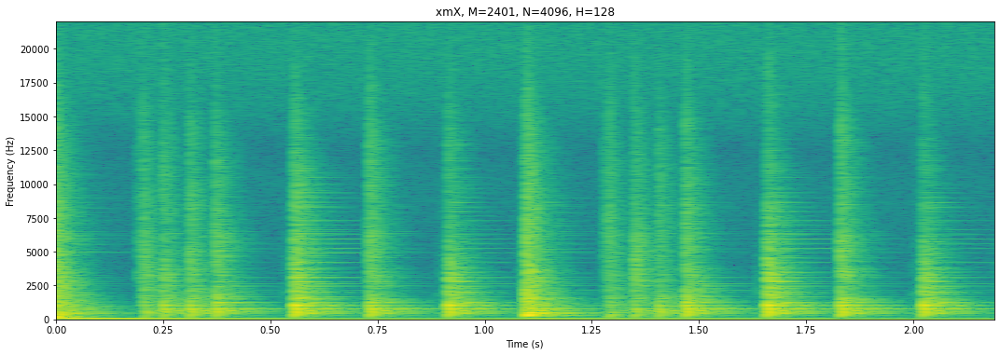

In [10]:
"""
compute its STFT and show the magnitude spectra
"""

# blackman is the default window for music. Even that this is not a 100% harmonical sound,
# there are some identificable pitches, 
window = 'blackman'

# size of the window has to be at least fs / lowest_freq * 6(blackman_bins). Analyzing the
# sound we can see that the lowest frequency is around 132Hz, I will add a margin os 20Hz.
lowest_freq = 132
# added a margin
margin = 20
# blackman bin size for the mainlobe
n_bin_mainlobe = 6
# compute the high closest k * 100 + 1 number
M = roundup_plus_1(fs / (lowest_freq - margin) * n_bin_mainlobe)
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 128
print("H:",H)

w = get_window(window, M)
xmX, xpX = stft.stftAnal(x, w, N, H)
plot_spectrogram(xmX, M, N, H, fs)

In [11]:
"""
explain why you choose this sound fragment
"""

'\nexplain why you choose this sound fragment\n'

In [12]:
"""
Describe the sound by using its temporal and spectral representation, 
focusing on what should be useful for processing the sound with spectral 
models, thus for deciding the spectral analysis parameters
"""

'\nDescribe the sound by using its temporal and spectral representation, \nfocusing on what should be useful for processing the sound with spectral \nmodels, thus for deciding the spectral analysis parameters\n'

In [13]:
"""
Show any partial, temporal or spectral, representation of the sound
to support your description
"""

'\nShow any partial, temporal or spectral, representation of the sound\nto support your description\n'

# Part 2 (option b): Theme and variations

In [14]:
"""
Choose a model that would allow to perform an adequate analysis of the 
sound, thinking on the transformation application. Perform the analysis
and check that the synthesis without transformations is good. Explain 
the choices made and the result obtained
"""

# The model I choose to perform the analysis and transformations is 
# the sinusoidal + stochastical model

# blackmanharris is default window for synthesis
window = 'blackmanharris'
# We could have used the same window size than the one used for the analysis, 
# however, this is a percussion sound, so if the window is too big, the transients gets
# really affected. In order to obtain better transients, the window size will be reduced
# this will make that the mainlobe on the lowest frequency will not be absolutely separated
# from the other mainlobes, but since this is a percussive sound, the timbre of the sound 
# should not be too affected.
M = 2001
N = 2048
t = -80
minSineDur = 0.02
maxnSines = 200
freqDevOffset = 11
freqDevSlope = 0.01
stocf = 0.75

# parameters for synthesis
H = 128
Ns = 512

# (fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
sfreq, smag, sphase, stocEnv = SPS.spsModelAnal(
    x,
    fs,
    w,
    N,
    H,
    t,
    minSineDur,
    maxnSines,
    freqDevOffset,
    freqDevSlope,
    stocf
)
y, ys, yst = SPS.spsModelSynth(sfreq, smag, sphase, stocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

In [15]:
# create files structure
# if not os.path.exists('train'):
#     os.makedirs('train')
# if not os.path.exists('test'):
#     os.makedirs('test')
# if not os.path.exists('train/foreground'):
#     os.makedirs('train/foreground')
# if not os.path.exists('train/background'):
#     os.makedirs('train/background')
# if not os.path.exists('test/foreground'):
#     os.makedirs('test/foreground')
# if not os.path.exists('test/background'):
#     os.makedirs('test/background')

In [16]:
"""
Perform a variety of single transformations (one single analysis/transformation/synthesis
sequence for each one), using any analysis model (not just the one used in in the previous part
and without the need to focus on quality of imitation), and covering a wide variety of effects
(natural an unnatural). Explain each transformation
"""

'\nPerform a variety of single transformations (one single analysis/transformation/synthesis\nsequence for each one), using any analysis model (not just the one used in in the previous part\nand without the need to focus on quality of imitation), and covering a wide variety of effects\n(natural an unnatural). Explain each transformation\n'

In [17]:
# Create drumloop transformation
"""
To create a drumloop I will use the previous analysis and use the stochasticTimeScale
and the sineTimeScale to scale in time the stochastic and sinusoids obtained in the 
Sinusoidal + stochastical analysis.

Since there's no method to timestrech focused in the SPS, I am merging both. However,
I will have to manually duplicate the phases.
"""
# duplicate the phases
phase=np.zeros(shape=(sphase.shape[0]*2,sphase.shape[1]))
phase_index = 0
sphase_index = 0
while phase_index < phase.shape[0]:
    phase[phase_index] = sphase[sphase_index]
    phase[phase_index + 1] = sphase[sphase_index]
    phase_index += 2
    sphase_index += 1

timeScaling = np.array([0, 0, 1, 2])

ytfreq, ytmag = SMT.sineTimeScaling(sfreq, smag, timeScaling)
ystocEnv = STCT.stochasticTimeScale(stocEnv, timeScaling)

# sinthesis with the duplicated sine and stochastic + the new phase
y, ys, yst = SPS.spsModelSynth(ytfreq, ytmag, phase, ystocEnv, Ns, H, fs)
# I want a 4x loop
drumloop = np.append(np.append(y,y), np.append(y,y))
ipd.display(ipd.Audio(data=drumloop, rate=fs))
wavwrite(drumloop, fs, 'train/foreground/drums.wav')

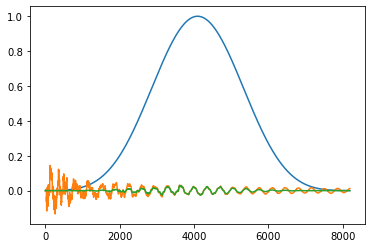

In [18]:
# create bass transformation
"""
For the bass I will make a granular synthesis of the first stroke of the percussion instrument
I will preserve the attack of the stroke and then add some windowed tails to create a sustain
"""
# stroke starts on 0 and lasts 0.207s
window_size = closest_down_2_power(int(0.207*fs))
stroke = x[0:window_size]
# The cropped stroke
ipd.display(ipd.Audio(data=stroke, rate=fs))


# I will create a bass note of 1/8 of the loop
bass_stroke = np.zeros(int(len(drumloop)/8))
hop = 1024
window = 'blackmanharris'
w = get_window(window,window_size)
plt.plot(w)
plt.plot(stroke)
plt.plot(stroke*w)
ipd.display(ipd.Audio(data=stroke*w, rate=fs))


# to preserve the attack
bass_stroke[0:window_size] += stroke
i = 0
while i < len(bass_stroke)-window_size:
    bass_stroke[i:i+window_size] += stroke*w
    i += hop

ipd.display(ipd.Audio(data=bass_stroke, rate=fs))



In [62]:
# now that we have pitch, I will use the Harmonic pitch transformation


window='hamming'
M=2047
N=2048
H=128
f0et=5.0
t=-90
minf0=80
maxf0=300
nH = 250
Ns = 512

w = get_window(window, M)
freqScaling = np.array([0, 0.7, 0.06, 0.5, 1, 0.5])
freqStretching = np.array([0, 1, 1, 0.99])
timbre_pres = 0

xhfreq, xhmag, xhphase = HM.harmonicModelAnal(bass_stroke, fs, w, N, H, t, nH, minf0, maxf0, f0et)
yhfreq, yhmag = HT.harmonicFreqScaling(
    xhfreq,
    xhmag,
    freqScaling,
    freqStretching,
    timbre_pres,
    fs
)
# synthesis 
bass_stroke_808 = SM.sineModelSynth(yhfreq, yhmag, np.array([]), Ns, H, fs)
ipd.display(ipd.Audio(data=bass_stroke_808, rate=fs))

print(bass_stroke_808.shape)





(96512,)


In [84]:
# A higher one for the pad


window='hamming'
M=2047
N=2048
H=128
f0et=5.0
t=-90
minf0=80
maxf0=150
nH = 250
Ns = 512

w = get_window(window, M)
freqScaling = np.array([0, 2, 1, 2])
freqStretching = np.array([0, 1, 1, 1.01])
timbre_pres = 0

xhfreq, xhmag, xhphase = HM.harmonicModelAnal(bass_stroke, fs, w, N, H, t, nH, minf0, maxf0, f0et)
yhfreq, yhmag = HT.harmonicFreqScaling(
    xhfreq,
    xhmag,
    freqScaling,
    freqStretching,
    timbre_pres,
    fs
)
# synthesis 
pad_stroke = SM.sineModelSynth(yhfreq, yhmag, np.array([]), Ns, H, fs)
ipd.display(ipd.Audio(data=pad_stroke, rate=fs))

print(pad_stroke.shape)





(96512,)


M: 4095
H: 512


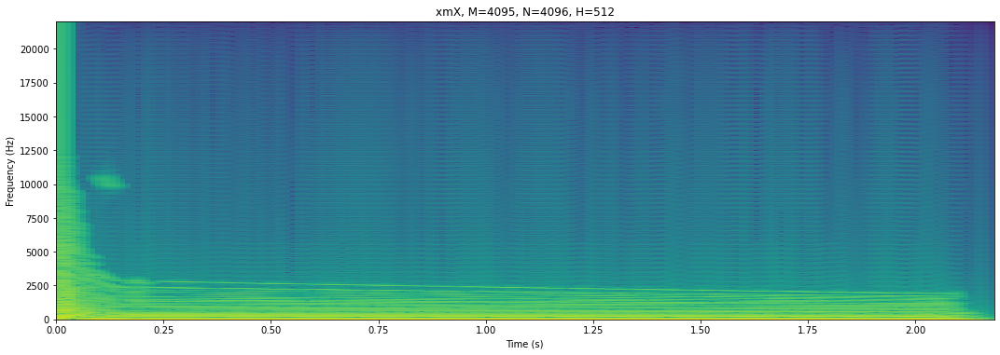

In [63]:
# Analysis of the 808
window = 'blackman'

M = 4095
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 512
print("H:",H)

w = get_window(window, M)
xmX, xpX = stft.stftAnal(bass_stroke_808, w, N, H)
plot_spectrogram(xmX, M, N, H, fs)

In [64]:
# We have a F0 at around 68Hz so I will modify the range of the F0 in the harmonic model analysis

In [99]:
# we've got our 808 :) now I will create an 8 notes array using the sinusoidal model
def create_harmony_line(notes_array, duration_array, note_audio, total_length, fs, w, N, H, t, nH, minf0, maxf0, f0et, Ns):
    musicline = np.zeros(total_length)
    fade_in = np.linspace(0, 1, int(0.080 * fs))
    fade_out = np.linspace(1, 0, int(0.080 * fs))
    
    xhfreq, xhmag, xhphase = HM.harmonicModelAnal(note_audio, fs, w, N, H, t, nH, minf0, maxf0, f0et)
    i = 0
    index = 0
    for note in notes_array:
        
        yhfreq, yhmag = HT.harmonicFreqScaling(
            xhfreq,
            xhmag,
            np.array([0,note,1,note]),
            np.array([0,1,1,1]),
            1,
            fs
        )
        # synthesis
        
        single_note = SM.sineModelSynth(yhfreq, yhmag, np.array([]), Ns, H, fs)        
        
        # adjust sustain duration
        note_length = math.floor(total_length/8*duration_array[index])
        print(single_note.shape)
        single_note = single_note[0:note_length]
        
        # however, we missed the attack, so I will replace the start with the original
        attack_time = int(0.126*fs)
        crossfade = int(0.08*fs)
        #crop the attack of the original sound
        attack_note = note_audio[0:attack_time]
        # create a fadeout in the end
        attack_note[attack_time-crossfade:attack_time] *= np.linspace(1, 0, crossfade)
        # if not silence:
        if not(notes_array[index] == 0):
            #crop note before the attack
            single_note[0:attack_time-crossfade] *= 0
            # create a fade in to mix with the attack
            single_note[attack_time-crossfade:attack_time] *= np.linspace(0, 1, crossfade)

            single_note[0:attack_time] += attack_note[0:attack_time]

            # fade in and fade out
            #single_note[0:len(fade_in)] *= fade_in
            single_note[len(single_note)-len(fade_out):len(single_note)] *= fade_out
        
        
        musicline[i:i+note_length] += single_note[0:note_length]
        
        i += note_length
        index += 1
    
    
    return musicline
        

In [66]:
notes = np.array([1,0.8,1.2,1,0,1,0.8,1.2,1.34])
durations = np.array([1,0.5,0.5, 1,1,1,0.5,0.5, 1])
window = 'blackmanharris'

M = 2001
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 256
t=-100
minf0=60
maxf0=80
nH = 150
Ns = 512
f0et = 5



w = get_window(window, M)

bass_line = create_harmony_line(
    notes,
    durations,
    bass_stroke_808,
    len(drumloop),
    fs,
    w,
    N,
    H,
    t,
    nH,
    minf0,
    maxf0,
    f0et,
    Ns
)

M: 2001
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)


In [67]:
ipd.display(ipd.Audio(data=bass_line, rate=fs))
wavwrite(bass_line, fs, 'train/background/bass.wav')

In [97]:
# create voice transformation
notes = np.array([1,0.8,1.2,1,0,1,0.8,1.2,1.34])
durations = np.array([1,0.5,0.5, 1,1,1,0.5,0.5, 1])
window = 'blackmanharris'

M = 2001
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 256
t=-150
minf0=80
maxf0=150
nH = 250
Ns = 512
f0et = 5

# M=2047
# N=2048
# H=128
# f0et=5.0
# t=-90
# minf0=80
# maxf0=150
# nH = 250
# Ns = 512

#### attack time should be a parameter

w = get_window(window, M)

pad_line = create_harmony_line(
    notes,
    durations,
    pad_stroke,
    len(drumloop),
    fs,
    w,
    N,
    H,
    t,
    nH,
    minf0,
    maxf0,
    f0et,
    Ns
)

M: 2001
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)
(96768,)


In [98]:
ipd.display(ipd.Audio(data=pad_line, rate=fs))
wavwrite(pad_line, fs, 'train/background/bass.wav')

In [136]:
# create other transformation

In [137]:
# create main voice transformation

In [26]:
from IPython.core.debugger import set_trace
# create sidechain compression to apply all except main voice
def sidechain_mix(foreground_mix, background_mix, fs, threshold, ratio, attack, release):
    # until now it does nothing with the attack or release
    output = np.zeros(len(foreground_mix))
    
    
    attack_ramp = np.linspace(1, ratio, int(fs*attack))
    release_ramp = np.linspace(ratio, 1, int(fs*release))
    compress = False
    
    i = 0
    while i < len(output):
        if(abs(foreground_mix[i]) > threshold and compress == False):
            
            #plt.plot(foreground_mix[i:i + len(attack_ramp)])
#            plt.plot(attack_ramp[0:len(background_mix[i:i + len(attack_ramp)])])
            #plt.plot(np.divide(background_mix[i:i + len(attack_ramp)],attack_ramp[0:len(background_mix[i:i + len(attack_ramp)])]))
            #plt.plot((background_mix[i:i + len(attack_ramp)]/attack_ramp[0:len(background_mix[i:i + len(attack_ramp)])]))
            
            #set_trace()
            output[i:i + len(attack_ramp)] = foreground_mix[i:i + len(attack_ramp)] + np.divide(background_mix[i:i + len(attack_ramp)],attack_ramp[0:len(background_mix[i:i + len(attack_ramp)])])
            i += len(attack_ramp)
            compress = True
        elif(compress):
            # we were compressing in the last iteration, but we could be above or below threshold
            if(abs(foreground_mix[i]) > threshold):
                # we are still above threshold, we compress
                output[i] = foreground_mix[i] + background_mix[i]/ratio
                compress = True
                i += 1
            else:
                # we were compressing, but we are not above th anymore: release
                output[i:i + len(release_ramp)] = foreground_mix[i:i + len(release_ramp)] + background_mix[i:i + len(release_ramp)]/release_ramp[0:len(background_mix[i:i + len(release_ramp)])]
                i += len(release_ramp)
                compress = False
        else:
            # we are not compressing nor above threshold, we do not compress
            output[i] = foreground_mix[i] + background_mix[i]
            i += 1
    return output
            

In [28]:
"""
Create your final sound mix by post-processing and mixing the transformations obtained in the
previous section (all done in python). Explain your intention, the process done, and the result
obtained.
"""
# submix foreground and background independently, then apply sidechain btw both
bass_line/=max(np.abs(bass_line))
drumloop/=max(np.abs(drumloop))
mix =  bass_line+ drumloop
ipd.display(ipd.Audio(data=mix, rate=fs))

threshold = 0.4
ratio = 4
# fast attack
attack = 0.02
# slow release
release = 0.2
fs = fs
mix2 = sidechain_mix(drumloop,bass_line, fs, threshold, ratio, attack, release)
ipd.display(ipd.Audio(data=mix2, rate=fs))

In [147]:
drumloop.shape

(772608,)

In [148]:
bass_line.shape

(772608,)

In [ ]:
# use scaper to create a coherent mix-? how to achieve coherent mix with scaper considering the sidechain?
# maybe my own version of scaper